In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

In [2]:
url="https://drive.google.com/file/d/1LO4i_-TkSmxnR0dgO5_lVLZ35FtGTNzA/view?usp=drive_link"
url="https://drive.google.com/uc?export=download&confirm=1&id=" + url.split("/")[-2]
total_db = pd.read_csv(url)
total_db.sample(5)

,Unnamed: 0,Nom,Etat,Code_Etat,id_Etat,id_county,NAME,geometry,fips,unemp_rate_year_2013,...,bachelors_deg_year_2018,score_legis,bchecks_2013,bchecks_2014,bchecks_2015,bchecks_2016,bchecks_2017,bchecks_2018,per_dem,per_gop
478,478,Laurens,Georgia,GA,27292,27814,Laurens,"POLYGON ((-83.226536 32.584201, -83.208715 32....",13175.0,9.7,...,15.6,1.25,527885,484580,566946,612985,541655,549532,0.346411,0.637649
1615,1615,Carbon,Montana,MT,27308,28959,Carbon,"POLYGON ((-109.798673 45.167339, -109.687792 4...",30009.0,4.2,...,32.0,1.15,137830,121836,127705,136337,123938,117607,0.307952,0.629580
406,406,Bryan,Georgia,GA,27292,27742,Bryan,"POLYGON ((-81.78154099999999 32.152524, -81.78...",13029.0,6.5,...,32.6,1.25,527885,484580,566946,612985,541655,549532,0.266215,0.697935
390,390,Walton,Florida,FL,27291,27725,Walton,"POLYGON ((-86.39725299999999 30.383498, -86.39...",12131.0,5.9,...,28.4,3.75,1073859,1034546,1147082,1435340,1276549,1203145,0.204446,0.765666
168,168,Perry,Arkansas,AR,149,693,Perry,"POLYGON ((-93.305684 34.875592, -93.288184 34....",5105.0,8.3,...,11.9,1.25,279736,234282,257346,266014,237629,248439,0.245668,0.707097


In [3]:
gun_violence_db = pd.read_csv('df_gun_violence.csv')
gun_violence_db.sample(5)

,Unnamed: 0,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,...,vict_injured,vict_arrested,vict_unharmed,vict_killed,handgun,rifle,Nine_mm,shotgun,young_sus,young_vict
160076,158422,719378,2016-12-05,Pennsylvania,Reading,2020 North 13th Street,0,1,http://www.gunviolencearchive.org/incident/719378,http://www.wfmz.com/news/berks/gun-goes-off-at...,...,1,0,0,0,0,0,0,0,0,0
67798,66174,331983,2015-04-30,Illinois,Chicago,2800 block of South Kostner Avenue,0,2,http://www.gunviolencearchive.org/incident/331983,http://www.chicagotribune.com/news/local/break...,...,1,0,0,0,0,0,0,0,0,1
89932,88005,413435,2015-09-14,Oklahoma,Tulsa,7300 block of East Jasper Street,0,1,http://www.gunviolencearchive.org/incident/413435,http://www.tulsaworld.com/homepagelatest/polic...,...,1,0,0,0,1,0,0,0,0,0
166047,164380,746729,2017-01-09,Missouri,Leasburg,3700 block of Nixon School Rd,1,0,http://www.gunviolencearchive.org/incident/746729,http://www.kmov.com/story/34221371/police-prop...,...,0,0,0,1,0,0,0,0,0,0
181029,179842,817561,2017-04-10,South Carolina,Easley,NaN,0,0,http://www.gunviolencearchive.org/incident/817561,http://www.4029tv.com/article/neighbor-grandso...,...,0,0,1,0,0,0,0,0,0,0


In [4]:
from shapely import wkt
def wkt_loads(x):
    try:
        return wkt.loads(x)
    except Exception:
        return None
total_db = total_db.dropna(subset=['geometry'])
total_db['geometry'] = total_db['geometry'].apply(wkt_loads)

In [5]:
total_db = total_db.loc[total_db['Etat'] != 'Alaska']
total_db = total_db.loc[total_db['Etat'] != 'Hawaii']

gun_violence_db = gun_violence_db.loc[gun_violence_db['state'] != 'Alaska']
gun_violence_db = gun_violence_db.loc[gun_violence_db['state'] != 'Hawaii']

In [6]:
total_db_geo = (
    gpd.GeoDataFrame(total_db)
    .set_geometry('geometry')
    .set_crs('EPSG:4269')
)

In [7]:
#changement de valeur pour Richmond, Virginia car valeur aberrante de 8.755 alors qu'il y avait 204 214	habitants en 2010
total_db_geo.loc[total_db_geo['id_county'] == 30306, 'resident_pop_year_2013'] = 204.214 
total_db_geo.loc[total_db_geo['id_county'] == 30306, 'resident_pop_year_2014'] = 204.214 
total_db_geo.loc[total_db_geo['id_county'] == 30306, 'resident_pop_year_2015'] = 204.214 
total_db_geo.loc[total_db_geo['id_county'] == 30306, 'resident_pop_year_2016'] = 204.214 
total_db_geo.loc[total_db_geo['id_county'] == 30306, 'resident_pop_year_2017'] = 204.214 
total_db_geo.loc[total_db_geo['id_county'] == 30306, 'resident_pop_year_2018'] = 204.214 

In [8]:
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(gun_violence_db['longitude'], gun_violence_db['latitude'])]
gun_violence_geo = gpd.GeoDataFrame(gun_violence_db, geometry=geometry, crs='EPSG:4326')

gun_violence_geo = gun_violence_geo.set_crs('EPSG:4326')
gun_violence_geo = gun_violence_geo[gun_violence_geo.geometry.x <= -50]

Merge des deux bases

In [9]:
total_db_geo=total_db_geo.to_crs('EPSG:4326')
merge_geo = gpd.sjoin(gun_violence_geo, total_db_geo, predicate='within')
geom_county=total_db_geo[['id_county','geometry']]
geom_county.head()

,id_county,geometry
0,27336,"POLYGON ((-86.92119 32.65754, -86.92035 32.658..."
1,27337,"POLYGON ((-88.02858 30.22676, -88.02399 30.230..."
2,27338,"POLYGON ((-85.74803 31.61918, -85.74543 31.618..."
3,27339,"POLYGON ((-87.42194 33.00338, -87.31854 33.006..."
4,27340,"POLYGON ((-86.96336 33.85822, -86.95967 33.857..."


In [10]:
merge_geo2=pd.merge(merge_geo, geom_county, on='id_county')
merge_geo2.head()

,Unnamed: 0_left,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,...,score_legis,bchecks_2013,bchecks_2014,bchecks_2015,bchecks_2016,bchecks_2017,bchecks_2018,per_dem,per_gop,geometry_y
0,100178,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."
1,104811,481268,2013-10-21,Pennsylvania,Pittsburgh (Homewood),7200 block of Kelly Street,2,5,http://www.gunviolencearchive.org/incident/481268,http://www.wtae.com/news/local/allegheny/two-p...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."
2,678,94128,2014-01-08,Pennsylvania,Homestead,Steak ‘n Shake at The Waterfront,1,0,http://www.gunviolencearchive.org/incident/94128,http://pittsburgh.cbslocal.com/2014/01/22/u-s-...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."
3,801,94504,2014-01-08,Pennsylvania,Munhall,Waterfront Shopping Complex,1,0,http://www.gunviolencearchive.org/incident/94504,http://www.post-gazette.com/local/south/2014/0...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."
4,1324,95999,2014-01-10,Pennsylvania,Pittsburgh,2000 block of Fifth Avenue,0,1,http://www.gunviolencearchive.org/incident/95999,/pittsburgh.cbslocal.com/2014/01/11/man-wounde...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."


In [11]:
merge_geo = merge_geo2.rename(columns={'geometry_x': 'point_geometry', 'geometry_y': 'polygon_geometry'})
merge_geo.head()

,Unnamed: 0_left,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,...,score_legis,bchecks_2013,bchecks_2014,bchecks_2015,bchecks_2016,bchecks_2017,bchecks_2018,per_dem,per_gop,polygon_geometry
0,100178,461105,2013-01-01,Pennsylvania,Mckeesport,1506 Versailles Avenue and Coursin Street,0,4,http://www.gunviolencearchive.org/incident/461105,http://www.post-gazette.com/local/south/2013/0...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."
1,104811,481268,2013-10-21,Pennsylvania,Pittsburgh (Homewood),7200 block of Kelly Street,2,5,http://www.gunviolencearchive.org/incident/481268,http://www.wtae.com/news/local/allegheny/two-p...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."
2,678,94128,2014-01-08,Pennsylvania,Homestead,Steak ‘n Shake at The Waterfront,1,0,http://www.gunviolencearchive.org/incident/94128,http://pittsburgh.cbslocal.com/2014/01/22/u-s-...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."
3,801,94504,2014-01-08,Pennsylvania,Munhall,Waterfront Shopping Complex,1,0,http://www.gunviolencearchive.org/incident/94504,http://www.post-gazette.com/local/south/2014/0...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."
4,1324,95999,2014-01-10,Pennsylvania,Pittsburgh,2000 block of Fifth Avenue,0,1,http://www.gunviolencearchive.org/incident/95999,/pittsburgh.cbslocal.com/2014/01/11/man-wounde...,...,4.0,1044731,899241,993429,1143220,1062651,1021943,0.564416,0.40034,"POLYGON ((-80.36078 40.47760, -80.34227 40.490..."


In [12]:
pd.set_option('display.max_columns', None)
merge_geo.sample()

,Unnamed: 0_left,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,incident_url_fields_missing,congressional_district,gun_stolen,gun_type_dict,incident_characteristics,latitude,location_description,longitude,n_guns_involved,notes,participant_age,participant_age_group,participant_gender,participant_name,participant_relationship,participant_status,participant_type,sources,state_house_district,state_senate_district,indic_suicide,indic_defens,indic_school,indic_home_inv,indic_accident,gun_type,relation,sus_adulte,vict_adulte,sus_male,vict_male,sus_injured,sus_arrested,sus_unharmed,sus_killed,vict_injured,vict_arrested,vict_unharmed,vict_killed,handgun,rifle,Nine_mm,shotgun,young_sus,young_vict,point_geometry,index_right,Unnamed: 0_right,Nom,Etat,Code_Etat,id_Etat,id_county,NAME,fips,unemp_rate_year_2013,unemp_rate_year_2014,unemp_rate_year_2015,unemp_rate_year_2016,unemp_rate_year_2017,unemp_rate_year_2018,med_h_income_year_2013,med_h_income_year_2014,med_h_income_year_2015,med_h_income_year_2016,med_h_income_year_2017,med_h_income_year_2018,resident_pop_year_2013,resident_pop_year_2014,resident_pop_year_2015,resident_pop_year_2016,resident_pop_year_2017,resident_pop_year_2018,snap_beneficiaries_year_2013,snap_beneficiaries_year_2014,snap_beneficiaries_year_2015,snap_beneficiaries_year_2016,snap_beneficiaries_year_2017,snap_beneficiaries_year_2018,bachelors_deg_year_2013,bachelors_deg_year_2014,bachelors_deg_year_2015,bachelors_deg_year_2016,bachelors_deg_year_2017,bachelors_deg_year_2018,score_legis,bchecks_2013,bchecks_2014,bchecks_2015,bchecks_2016,bchecks_2017,bchecks_2018,per_dem,per_gop,polygon_geometry
136980,82761,395287,2015-08-13,South Carolina,Loris,Bennett Loop Road,0,2,http://www.gunviolencearchive.org/incident/395287,http://www.carolinalive.com/news/story.aspx?id...,False,7.0,NaN,NaN,"['Shot - Wounded/Injured', 'Drive-by (car to s...",33.9626,NaN,-78.8298,NaN,"1 woman and 2 girls, who was inj not given",NaN,NaN,"{0: 'Female', 1: 'Female'}",NaN,NaN,"{0: 'Injured', 1: 'Injured'}","{0: 'Victim', 1: 'Victim'}",NaN,105.0,28.0,0,0,0,0,0,NaN,NaN,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,POINT (-78.82980 33.96260),2354,2354,Horry,South Carolina,SC,27323,29714,Horry,45051.0,7.8,8.5,7.5,6.0,5.6,6.4,41808.0,42830.0,47083.0,45608.0,45979.0,49082.0,289.005,298.042,309.35,321.542,333.246,344.68,50311.0,47448.0,46431.0,43937.0,39784.0,36227.0,22.7,22.9,22.8,22.6,23.0,23.6,1.25,335695,289764,326997,402978,396920,280749,0.295021,0.673229,"POLYGON ((-79.33884 33.97049, -79.33684 33.971..."


# Stats descriptives sur les indicateurs socio-économiques des comtés
## Revenu médian

In [13]:
print("I. Statistiques descriptives sur les indicateurs socio-économiques des comtés \n")
print("Le revenu médian :")

I. Statistiques descriptives sur les indicateurs socio-économiques des comtés 

Le revenu médian :


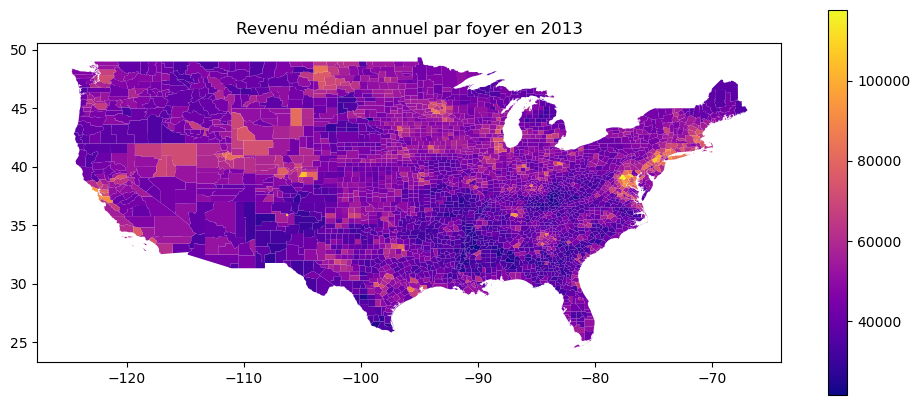

In [14]:
total_db_geo.plot(aspect = 1, figsize = (12,5), column = "med_h_income_year_2013", legend = True, cmap = "plasma", linewidth = 0.1)
plt.title("Revenu médian annuel par foyer en 2013")
plt.show()

Ces représentations sont difficilement lisibles car il y a beaucoup de comtés. Une solution est de classer les comtés et de les colorier en fonction de leur classement, en définissant par exemple 4 quantiles. 

In [15]:
print("Ces représentations sont difficilement lisibles car il y a beaucoup de comtés. \nUne solution est de classer les comtés et de les colorier en fonction de leur classement, en définissant par exemple 4 quantiles. ")

Ces représentations sont difficilement lisibles car il y a beaucoup de comtés. 
Une solution est de classer les comtés et de les colorier en fonction de leur classement, en définissant par exemple 4 quantiles. 


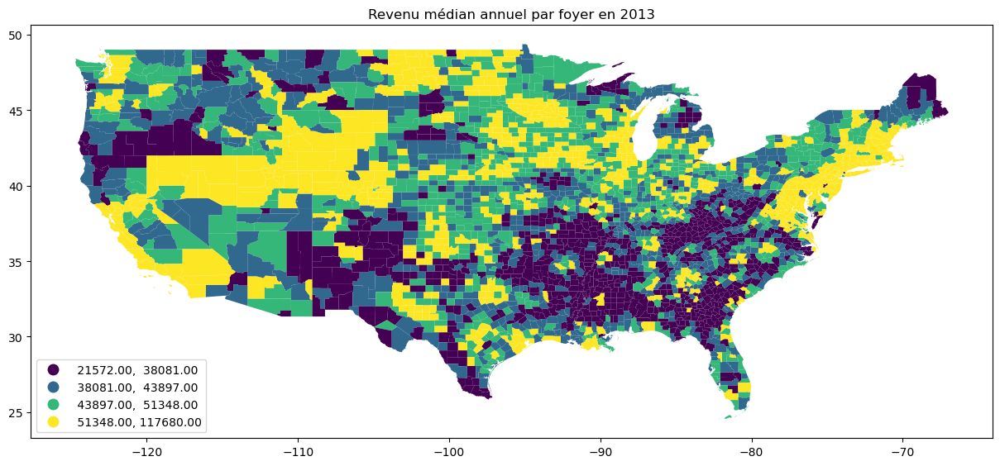

In [16]:
total_db_geo.plot(aspect = 1, figsize = (15,15), column = "med_h_income_year_2013", legend = True, 
scheme = "Quantiles", k = 4, linewidth = 0.1, legend_kwds={'loc': 'lower left'})
plt.title("Revenu médian annuel par foyer en 2013")
plt.show()

Cette représentation a l'avantage de permettre de distinguer rapidement des groupes de comtés. Cependant, il faut garder en tête que la dernière catégorie recouvre beaucoup de valeurs différentes (du simple au double).

On voit sur cette carte que les comtés du Sud-Ouest sont ceux avec le revenu médian le plus faible, alors que les plus rivhes se situent surtout au Nord.

In [17]:
print("Cette représentation a l'avantage de permettre de distinguer rapidement des groupes de comtés. \nCependant, il faut garder en tête que la dernière catégorie recouvre beaucoup de valeurs différentes (du simple au double).")
print("On voit sur cette carte que les comtés du Sud-Ouest sont ceux avec le revenu médian le plus faible, alors que les plus riches se situent surtout au Nord.")

Cette représentation a l'avantage de permettre de distinguer rapidement des groupes de comtés. 
Cependant, il faut garder en tête que la dernière catégorie recouvre beaucoup de valeurs différentes (du simple au double).
On voit sur cette carte que les comtés du Sud-Ouest sont ceux avec le revenu médian le plus faible, alors que les plus riches se situent surtout au Nord.


Text(0.5, 0, 'Revenu annuel médian par foyer en 2013')

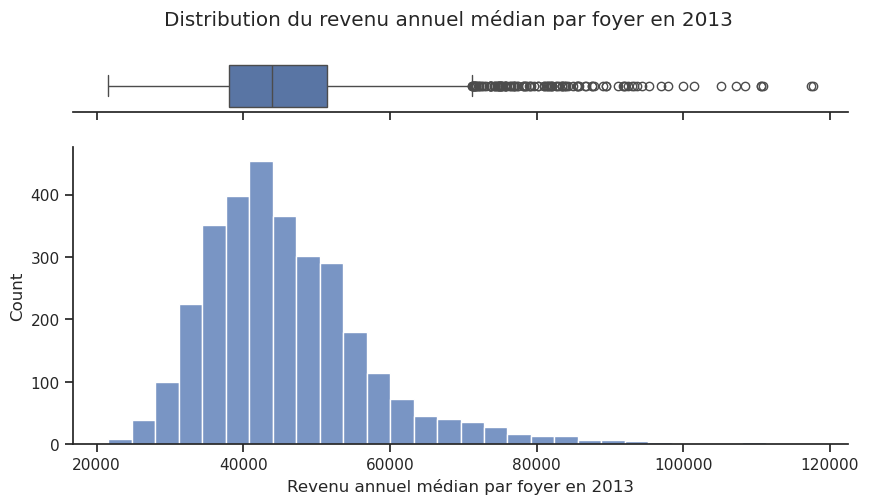

In [18]:
sns.set(style="ticks")
x = total_db_geo["med_h_income_year_2013"] 

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize = (10, 5), gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=30, ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

plt.suptitle("Distribution du revenu annuel médian par foyer en 2013")
ax_hist.set_xlabel('Revenu annuel médian par foyer en 2013')

In [19]:
print("La distribution du revenu annuel médian par foyer en 2013 semble suivre une loi log-normale, car elle ressemble à une normale avec une plus grande queue à droite. \nLe box-plot semble confirmer cela : les 'valeurs aberrantes' ne sont présentes qu'à droite de la distribution.\n")


La distribution du revenu annuel médian par foyer en 2013 semble suivre une loi log-normale, car elle ressemble à une normale avec une plus grande queue à droite. 
Le box-plot semble confirmer cela : les 'valeurs aberrantes' ne sont présentes qu'à droite de la distribution.



La distribution du revenu annuel médian par foyer en 2013 semble suivre une loi log-normale, car elle ressemble à une normale avec une plus grande queue à droite. Le box-plot semble confirmer cela : les "valeurs aberrantes" ne sont présentes qu'à droite de la distribution.

## Proportion de détenteurs d'un bachelor

In [20]:
print("Proportion de détenteurs d'un bachelor : ")

Proportion de détenteurs d'un bachelor : 


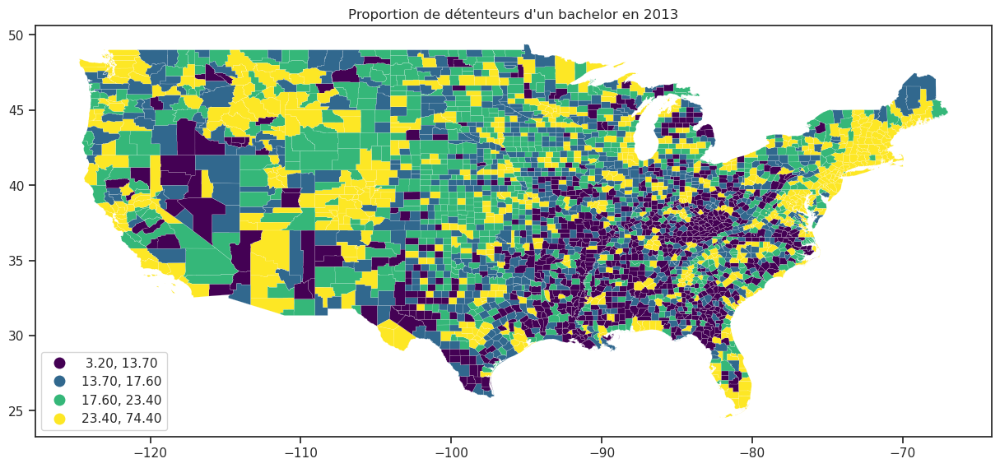

In [21]:
total_db_geo.plot(aspect = 1, figsize = (15,15), column = "bachelors_deg_year_2013", legend = True, scheme = "QUANTILES", 
k=4, linewidth = 0.1, legend_kwds={'loc': 'lower left'})
plt.title("Proportion de détenteurs d'un bachelor en 2013")
plt.show()

A nouveau, le Nord-Est est privilégié, avec la plus grosse part de détententeurs de bachelors. Le Sud-Est est encore une fois défavorisé, avec preque tout le premier quantile situé à cet endroit.

In [22]:
print("A nouveau, le Nord-Est est privilégié, avec la plus grosse part de détententeurs de bachelors. \nLe Sud-Est est encore une fois défavorisé, avec la quasi-totalité du premier quantile située à cet endroit.")

A nouveau, le Nord-Est est privilégié, avec la plus grosse part de détententeurs de bachelors. 
Le Sud-Est est encore une fois défavorisé, avec la quasi-totalité du premier quantile située à cet endroit.


Text(0.5, 0, 'Proportion de diplômés de bachelor en 2013')

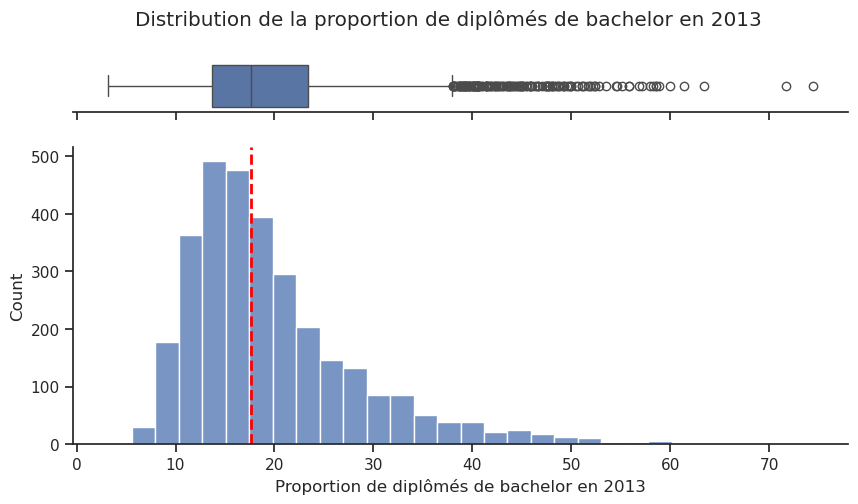

In [23]:
sns.set(style="ticks")
x = total_db_geo["bachelors_deg_year_2013"] 

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize = (10, 5), gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=30, ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

median_value = x.median()
ax_hist.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label='Median')

plt.suptitle("Distribution de la proportion de diplômés de bachelor en 2013")
ax_hist.set_xlabel('Proportion de diplômés de bachelor en 2013')

On obtient encore une fois une courbe normale biaisé vers la droite de la distribution. Les valeurs aberrantes sont toutes situées de ce côté de la distribution. On voit bien sur le boxplot les inégalités très importantes qui peut exister entre les comtés. Cela est assez logique : le comté étant un découpage relativement fin du territoire américain, il n'est pas étonnant de grosses variations à cette échelle.

## Bénéficiaires du programme SNAP

In [24]:
print("On obtient encore une fois une courbe normale biaisée vers la droite de la distribution. Les valeurs aberrantes sont toutes situées de ce côté de la distribution. \nOn voit bien sur le boxplot les inégalités très importantes qui peuvent exister entre les comtés. Cela est assez logique : le comté étant un découpage relativement fin du territoire américain, il n'est pas étonnant que de grosses variations existent à cette échelle.\n")
print("Bénéficiaires du programme SNAP :")

On obtient encore une fois une courbe normale biaisée vers la droite de la distribution. Les valeurs aberrantes sont toutes situées de ce côté de la distribution. 
On voit bien sur le boxplot les inégalités très importantes qui peuvent exister entre les comtés. Cela est assez logique : le comté étant un découpage relativement fin du territoire américain, il n'est pas étonnant que de grosses variations existent à cette échelle.

Bénéficiaires du programme SNAP :


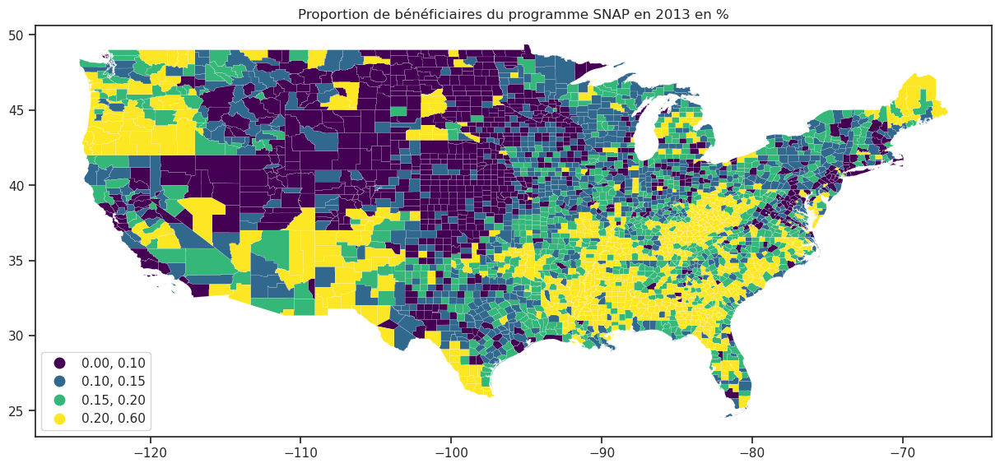

In [25]:
total_db_geo["snap_share_year_2013"] = total_db_geo["snap_beneficiaries_year_2013"] / total_db_geo["resident_pop_year_2013"] / 1000
total_db_geo.plot(aspect = 1, figsize = (15,15), column = "snap_share_year_2013", legend = True, scheme = "QUANTILES", 
k=4, linewidth = 0.1, legend_kwds={'loc': 'lower left'})
plt.title("Proportion de bénéficiaires du programme SNAP en 2013 en %")
plt.show()

On retrouve la distinction Nord-Est privilégié / Sud-Est défavorisé ici encore : les taux de bénéficaires les plus bas sont situés au Nord-Est et les plus importants dnas le Sud, et en particulier le Sud-Est. Le Nord et le centre du pays font partie des deux premiers quartiles, alors que le Nord-Ouest fait également partie des territoires avec la plus grande part de bénéficiaires.

In [26]:
print("On retrouve la distinction Nord-Est privilégié / Sud-Est défavorisé ici encore : les taux de bénéficaires les plus bas sont situés au Nord-Est et les plus importants dnas le Sud, et en particulier le Sud-Est. \nLe Nord et le centre du pays font partie des deux premiers quartiles, alors que le Nord-Ouest fait également partie des territoires avec la plus grande part de bénéficiaires.")

On retrouve la distinction Nord-Est privilégié / Sud-Est défavorisé ici encore : les taux de bénéficaires les plus bas sont situés au Nord-Est et les plus importants dnas le Sud, et en particulier le Sud-Est. 
Le Nord et le centre du pays font partie des deux premiers quartiles, alors que le Nord-Ouest fait également partie des territoires avec la plus grande part de bénéficiaires.


Text(0.5, 0, 'Proportion de bénéficiaire du SNAP en 2013 en %')

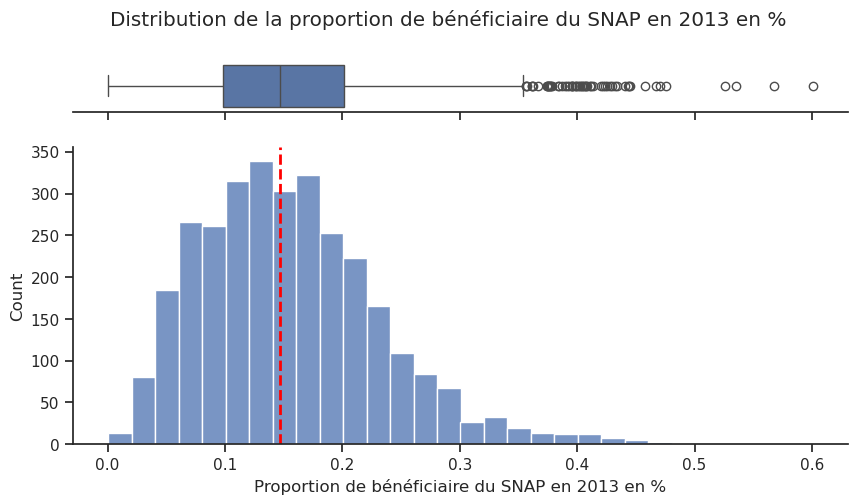

In [27]:

sns.set(style="ticks")
x = total_db_geo["snap_share_year_2013"] 

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=(10,5))

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=30, ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

median_value = x.median()
ax_hist.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label='Median')

plt.suptitle("Distribution de la proportion de bénéficiaire du SNAP en 2013 en %")
ax_hist.set_xlabel('Proportion de bénéficiaire du SNAP en 2013 en %')

On retrouve globalement la même forme de distribution, mais un peu plus étalée que les deux vues précédemment. Encore une fois, la courbe en cloche est biaisée vers la droite, où se situent toutes les valeurs aberrantes. 

## Taux de chômage

In [28]:
print("On retrouve globalement la même forme de distribution, mais un peu plus étalée que les deux vues précédemment. Encore une fois, la courbe en cloche est biaisée vers la droite, où se situent toutes les valeurs aberrantes. \n")
print("Taux de chômage :")

On retrouve globalement la même forme de distribution, mais un peu plus étalée que les deux vues précédemment. Encore une fois, la courbe en cloche est biaisée vers la droite, où se situent toutes les valeurs aberrantes. 

Taux de chômage :


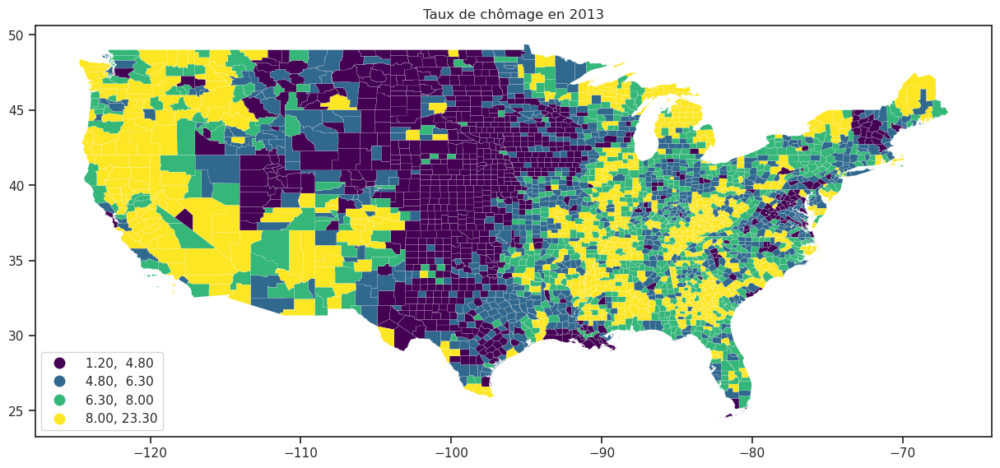

In [29]:
total_db_geo.plot(aspect = 1, figsize = (15,15), column = "unemp_rate_year_2013", legend = True, scheme = "QUANTILES", k=4, 
linewidth = 0.1, legend_kwds={'loc': 'lower left'})
plt.title("Taux de chômage en 2013")
plt.show()

La répartition géographique du taux de chômage semble totalement différente des autres : toute la côte Ouest est dans le dernier quartile, et l'Est aussi, alors que c'est le centre qui a le taux de chômage le plus bas. Certaines zones connues pour leur désindustrialisation sont dans le dernier quartile, comme la région de Détroit par exemple.

In [30]:
print("La répartition géographique du taux de chômage semble totalement différente des autres : toute la côte Ouest ainsi que l'Est sont dans le dernier quartile, alors que c'est le centre qui a le taux de chômage le plus faible. \nCertaines zones connues pour leur désindustrialisation sont dans le dernier quartile, comme la région de Détroit par exemple.")

La répartition géographique du taux de chômage semble totalement différente des autres : toute la côte Ouest ainsi que l'Est sont dans le dernier quartile, alors que c'est le centre qui a le taux de chômage le plus faible. 
Certaines zones connues pour leur désindustrialisation sont dans le dernier quartile, comme la région de Détroit par exemple.


Text(0.5, 0, 'Taux de chômage en 2013')

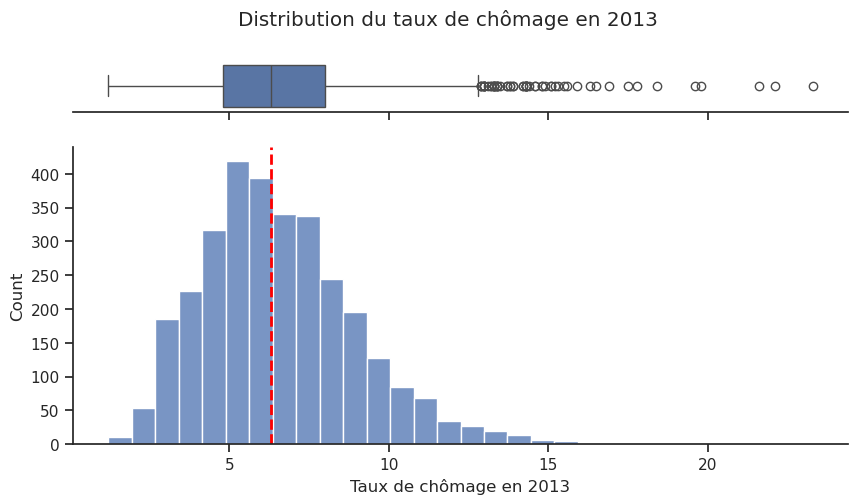

In [31]:
sns.set(style="ticks")
x = total_db_geo["unemp_rate_year_2013"] 

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=(10,5))

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=30, ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

median_value = x.median()
ax_hist.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label='Median')

plt.suptitle("Distribution du taux de chômage en 2013")
ax_hist.set_xlabel('Taux de chômage en 2013')

La distribution a la forme que nous avons vu déjà plusieurs fois. On remarque que les valuers aberrantes sont de plus en plus espacées au fur et à mesure qu'elles augmentent.

## Vote pour les démocrates à l'élection présidentielle de 2016

In [32]:
print("La forme de la distribution est de nouveau similaires à celles vues précédemments. \nOn remarque que les valuers aberrantes sont de plus en plus espacées au fur et à mesure qu'elles augmentent.\n")
print("Vote pour les démocrates à l'élection présidentielle de 2016")

La forme de la distribution est de nouveau similaires à celles vues précédemments. 
On remarque que les valuers aberrantes sont de plus en plus espacées au fur et à mesure qu'elles augmentent.

Vote pour les démocrates à l'élection présidentielle de 2016


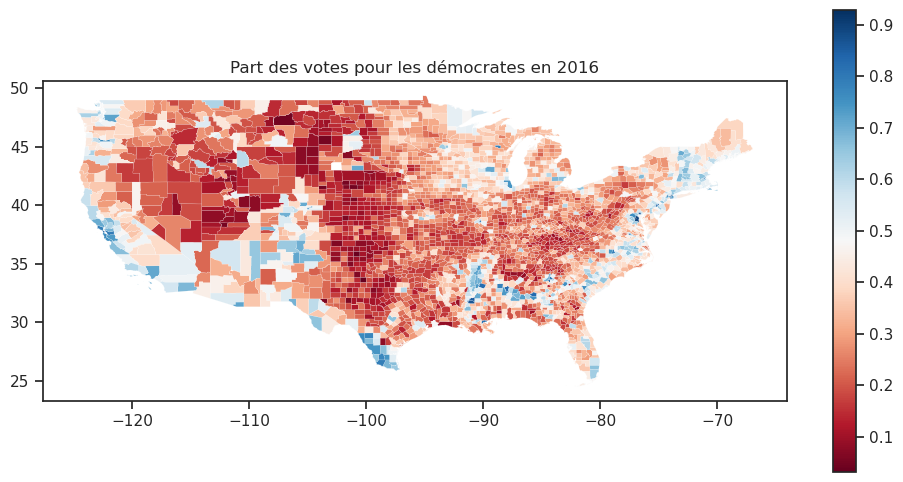

In [33]:
total_db_geo.plot(aspect = 1, figsize = (12,6), column = "per_dem", legend = True, linewidth = 0.1, cmap = "RdBu")
plt.title("Part des votes pour les démocrates en 2016")
plt.show()

Cette représentation a le défaut de laisser penser que les républicains ont largement gagné le vote de 2016, puisque la carte est en grande majorité rouge. Pour remédier à cela, il faut faire une représentation qui pondère le vote par la population résidente de 2016.

In [34]:
print("Cette représentation a le défaut de laisser penser que les républicains ont largement gagné le vote de 2016, puisque la carte est en grande majorité rouge. \nPour remédier à cela, il faut faire une représentation qui pondère le vote par la population résidente de 2016.")

Cette représentation a le défaut de laisser penser que les républicains ont largement gagné le vote de 2016, puisque la carte est en grande majorité rouge. 
Pour remédier à cela, il faut faire une représentation qui pondère le vote par la population résidente de 2016.


/tmp/ipykernel_8015/656898130.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  total_db_geo['centroid'] = total_db_geo['geometry'].centroid


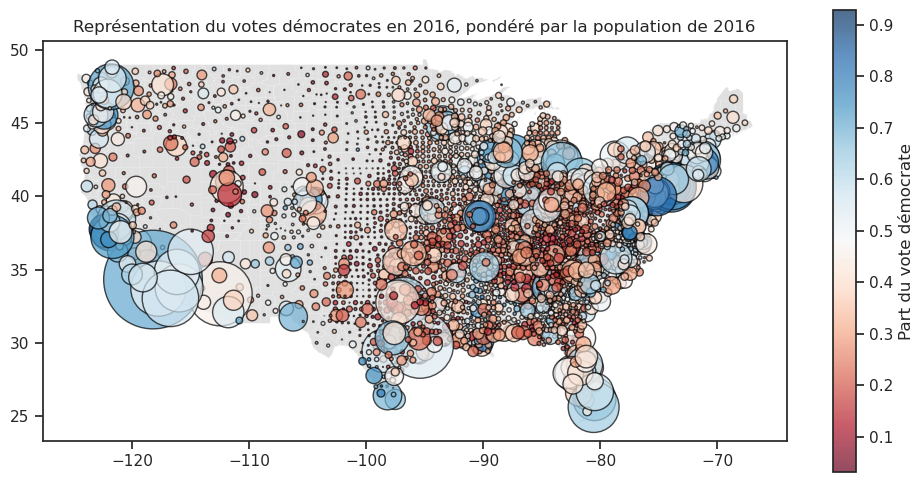

In [35]:
total_db_geo = total_db_geo.to_crs(4329)
total_db_geo['centroid'] = total_db_geo['geometry'].centroid

# Create a GeoDataFrame with centroids
gdf_centroids = gpd.GeoDataFrame(total_db_geo[['resident_pop_year_2016', "per_dem", "centroid"]], geometry=total_db_geo['centroid'])

# Plot
# Plot polygons
fig, ax = plt.subplots(figsize=(12, 6))
total_db_geo.plot(ax=ax, color='lightgray', alpha=0.7, edgecolor='white', linewidth=0.1)

# Plot centroids as dots with color and size based on variables
sc = ax.scatter(
    gdf_centroids['centroid'].x,
    gdf_centroids['centroid'].y,
    c=gdf_centroids['per_dem'],
    cmap='RdBu',
    s=gdf_centroids['resident_pop_year_2016']*0.5,
    alpha=0.7,
    marker='o',
    edgecolors='black',  # Add black edges for better visibility
    linewidths=1,        # Adjust linewidth of the edges
)

# Set plot title and labels
plt.title('Représentation du votes démocrates en 2016, pondéré par la population de 2016')

# Add colorbar
cbar = plt.colorbar(sc, label='Part du vote démocrate')

# Show the plot
plt.show()

Même si la carte n'est pas forcément évidente à lire à cause des chevauchements des cercles (dont la taille dépend de la population résidente), on voit que le bleu et le rouge (et donc les électeurs démocrates et républicains) sont relativement égaux sur le territoire, ce qui est plus fidèle au résultat de l'élection. La Californie et le Nord-Est (qui sont souvent favorisés dans les statistiques précédentes) sont plutôt démocrates, alors que le Sud-Est, plus défavorisé, penche plutôt en faveur des républicains

In [36]:
print("Même si la carte n'est pas forcément évidente à lire à cause des chevauchements des cercles (dont la taille dépend de la population résidente), on voit que le bleu et le rouge (et donc les électeurs démocrates et républicains) sont relativement égaux sur le territoire, ce qui est plus fidèle au résultat de l'élection. \nLa Californie et le Nord-Est (qui sont souvent favorisés dans les statistiques précédentes) sont plutôt démocrates, alors que le Sud-Est, plus défavorisé, penche plutôt en faveur des républicains.")
print("De plus, si on s'intéresse uniquement à la taille des cercles, cette carte nous permet également de visualiser la densité de la population. Cette densité est beaucoup plus élevée sur la côte Ouest et sur la moitié Est du pays, au contraire du centre qui est relativement très peu densément peuplé et beaucoup plus rural.")

Même si la carte n'est pas forcément évidente à lire à cause des chevauchements des cercles (dont la taille dépend de la population résidente), on voit que le bleu et le rouge (et donc les électeurs démocrates et républicains) sont relativement égaux sur le territoire, ce qui est plus fidèle au résultat de l'élection. 
La Californie et le Nord-Est (qui sont souvent favorisés dans les statistiques précédentes) sont plutôt démocrates, alors que le Sud-Est, plus défavorisé, penche plutôt en faveur des républicains.
De plus, si on s'intéresse uniquement à la taille des cercles, cette carte nous permet également de visualiser la densité de la population. Cette densité est beaucoup plus élevée sur la côte Ouest et sur la moitié Est du pays, au contraire du centre qui est relativement très peu densément peuplé et beaucoup plus rural.


## Densité de population

/tmp/ipykernel_8015/1090814408.py:1: UserWarning:

Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




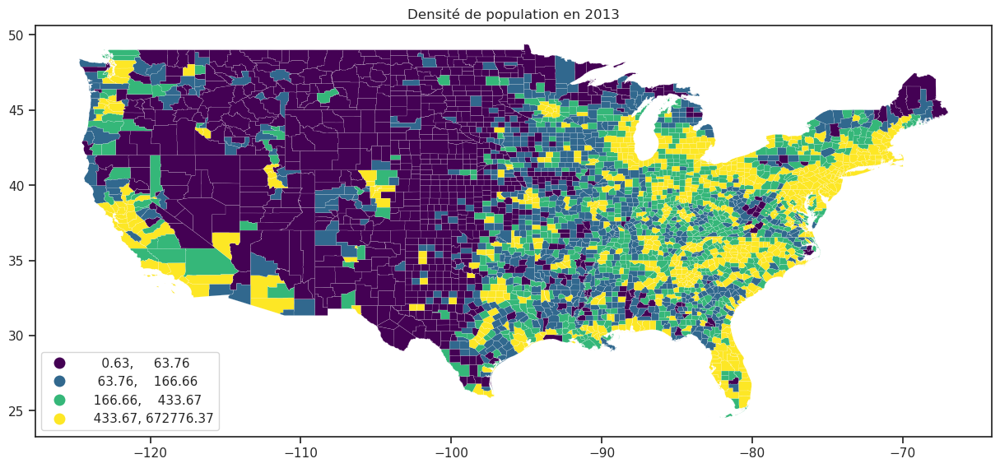

In [80]:
total_db_geo["pop_density_2013"] = total_db_geo["resident_pop_year_2013"] / total_db_geo["geometry"].area
total_db_geo.plot(aspect = 1, figsize = (15,15), column = "pop_density_2013", legend = True, scheme = "QUANTILES", k=4, 
linewidth = 0.1, legend_kwds={'loc': 'lower left'})
plt.title("Densité de population en 2013")
plt.show()

On remarque que l'Est et les côtes du pays concentrent les territoires les plus denses, alors que que l'Ouest et le centre ont des densités plus faibles

In [81]:
print("On remarque que l'Est et les côtes du pays concentrent les territoires les plus denses, alors que que l'Ouest et le centre ont des densités plus faibles")

On remarque que l'Est et les côtes du pays concentrent les territoires les plus denses, alors que que l'Ouest et le centre ont des densités plus faibles


Text(0.5, 0, 'Densité')

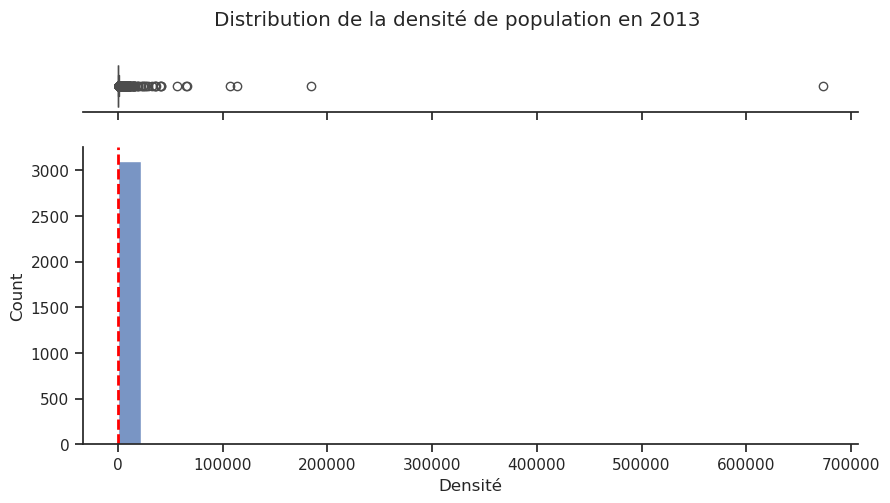

In [82]:
sns.set(style="ticks")
x = total_db_geo["pop_density_2013"] 

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=(10,5))

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=30, ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

median_value = x.median()
ax_hist.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label='Median')

plt.suptitle("Distribution de la densité de population en 2013")
ax_hist.set_xlabel('Densité')

On remarque qu'il y a un outlier particulièrement surprenant, vérifions à la main ce qu'il est en est.

In [83]:
print("On remarque qu'il y a un outlier particulièrement surprenant, vérifions à la main ce qu'il est en est.")

On remarque qu'il y a un outlier particulièrement surprenant, vérifions à la main ce qu'il est en est.


In [84]:
total_db_geo[total_db_geo["pop_density_2013"] == total_db_geo["pop_density_2013"].max()]
print("Le comté de Fairfax semble présenter une erreur, nous allons regarder la distributioin de la densité sans les valeurs trop extrêmes.")

,Unnamed: 0,Nom,Etat,Code_Etat,id_Etat,id_county,NAME,geometry,fips,unemp_rate_year_2013,unemp_rate_year_2014,unemp_rate_year_2015,unemp_rate_year_2016,unemp_rate_year_2017,unemp_rate_year_2018,med_h_income_year_2013,med_h_income_year_2014,med_h_income_year_2015,med_h_income_year_2016,med_h_income_year_2017,med_h_income_year_2018,resident_pop_year_2013,resident_pop_year_2014,resident_pop_year_2015,resident_pop_year_2016,resident_pop_year_2017,resident_pop_year_2018,snap_beneficiaries_year_2013,snap_beneficiaries_year_2014,snap_beneficiaries_year_2015,snap_beneficiaries_year_2016,snap_beneficiaries_year_2017,snap_beneficiaries_year_2018,bachelors_deg_year_2013,bachelors_deg_year_2014,bachelors_deg_year_2015,bachelors_deg_year_2016,bachelors_deg_year_2017,bachelors_deg_year_2018,score_legis,bchecks_2013,bchecks_2014,bchecks_2015,bchecks_2016,bchecks_2017,bchecks_2018,per_dem,per_gop,snap_share_year_2013,centroid,snap_share_year_2014,snap_share_year_2015,snap_share_year_2016,snap_share_year_2017,snap_share_year_2018,pop_density_2013
2874,2874,Fairfax,Virginia,VA,27330,30239,Fairfax,"POLYGON ((-77.33479 38.85383, -77.33332 38.856...",51600.0,3.9,3.5,3.0,3.0,2.5,2.9,110658.0,110507.0,112844.0,115518.0,117989.0,122035.0,1132.186,1136.794,1141.04,1144.957,1149.346,1149.688,50288.0,45702.0,46101.0,45197.0,41904.0,39868.0,58.6,59.2,59.9,60.3,60.7,61.1,2.0,498426,419764,462997,528369,520827,476760,0.621141,0.311709,0.044417,POINT (-77.29973 38.85309),0.040203,0.040403,0.039475,0.036459,0.034677,672776.368456


Text(0.5, 0, 'Densité')

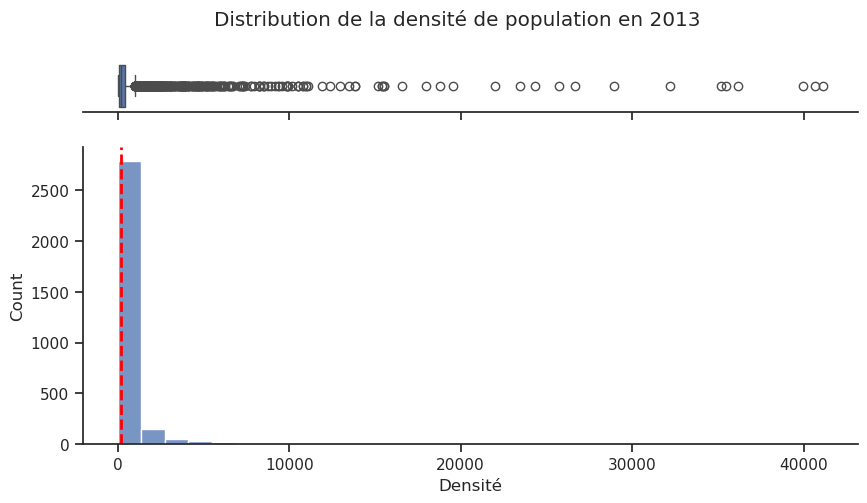

In [86]:
sns.set(style="ticks")
x = total_db_geo[total_db_geo["pop_density_2013"] <  50000]["pop_density_2013"]

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=(10,5))

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=30, ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

median_value = x.median()
ax_hist.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label='Median')

plt.suptitle("Distribution de la densité de population en 2013")
ax_hist.set_xlabel('Densité')

La distribution possède de nombreux outliers à droite, même quand on se restreint à des valeurs plus faibles.

## Comparaison des différentes années

Nous avons les données sur plusieurs années (entre 2013 et 2018, années de constitution de la base des incidents). Plutôt que faire une carte par année, nous allons vérifier que les données ne changent pas trop d'une année à l'autre, et que les tendances générales restent stables. Nous allons donc regarder les matrices de corrélation d'une même variable entre différentes années.

### Chômage

In [37]:
print("\nII. Comparaison des différentes années\n")
print("Nous avons les données sur plusieurs années (entre 2013 et 2018, années de constitution de la base des incidents). \nPlutôt que faire une carte par année, nous allons vérifier que les données ne changent pas trop d'une année à l'autre, et que les tendances générales restent stables. Nous allons donc regarder les matrices de corrélation d'une même variable entre différentes années.\n")
print("Chômage :")


II. Comparaison des différentes années

Nous avons les données sur plusieurs années (entre 2013 et 2018, années de constitution de la base des incidents). 
Plutôt que faire une carte par année, nous allons vérifier que les données ne changent pas trop d'une année à l'autre, et que les tendances générales restent stables. Nous allons donc regarder les matrices de corrélation d'une même variable entre différentes années.

Chômage :


In [38]:
matrix = total_db_geo[["unemp_rate_year_2013", "unemp_rate_year_2014", "unemp_rate_year_2015", 
"unemp_rate_year_2016", "unemp_rate_year_2017", "unemp_rate_year_2018"]].corr()
fig = px.imshow(matrix, title= "Matrice de corrélation des taux de chômage", labels = {"color" : "Corrélation"})
fig.show()

On voit que toutes les corrélations sont supérieures à 80%, ce qui est relativement important et laisse penser que le taux de chômage reste relativement stable sur les années.

In [39]:
print("On voit que toutes les corrélations sont supérieures à 80%, ce qui est relativement important et laisse penser que le taux de chômage reste relativement stable sur les années considérées.")

On voit que toutes les corrélations sont supérieures à 80%, ce qui est relativement important et laisse penser que le taux de chômage reste relativement stable sur les années considérées.


Text(0.5, 1, 'Hexbin du taux de chômage entre 2013 et 2018')

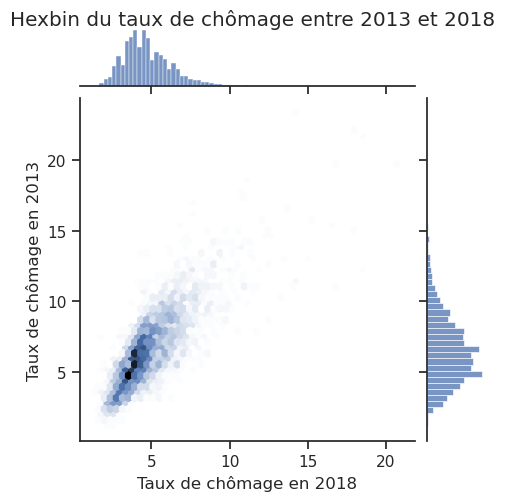

In [40]:
sns.set_theme(style="ticks")
x = total_db_geo["unemp_rate_year_2018"]
y = total_db_geo["unemp_rate_year_2013"]
joint_plot = sns.jointplot(x=x, y=y, kind="hex", height = 5)
joint_plot.set_axis_labels("Taux de chômage en 2018", "Taux de chômage en 2013")
joint_plot.fig.suptitle("Hexbin du taux de chômage entre 2013 et 2018", y =1)

Cet hexbin montre que les taux de chômage entre 2013 et 2018 sont effectivement positivement corrélés. On remarque également qu'il n'y a que très peu de comtés ayant un faible taux à une année et un taux important pour l'autre année, ce qui suggère que les analyses resteront valables peu importe l'année retenue pour cette variable. Il convient de vérifier cela pour les autres variables.

### Revenu annuel médian par foyer

In [41]:
print("Cet hexbin montre que les taux de chômage entre 2013 et 2018 sont effectivement positivement corrélés. \nOn remarque également qu'il n'y a que très peu de comtés ayant un faible taux à une année et un taux important pour l'autre année, ce qui suggère que les analyses resteront valables peu importe l'année retenue pour cette variable. \nIl convient de vérifier cela pour les autres variables.")
print("\nRevenu annuel médian par foyer :")

Cet hexbin montre que les taux de chômage entre 2013 et 2018 sont effectivement positivement corrélés. 
On remarque également qu'il n'y a que très peu de comtés ayant un faible taux à une année et un taux important pour l'autre année, ce qui suggère que les analyses resteront valables peu importe l'année retenue pour cette variable. 
Il convient de vérifier cela pour les autres variables.

Revenu annuel médian par foyer :


In [42]:
matrix = total_db_geo[["med_h_income_year_2013", "med_h_income_year_2014", "med_h_income_year_2015", 
"med_h_income_year_2016", "med_h_income_year_2017", "med_h_income_year_2018"]].corr()
fig = px.imshow(matrix, title= "Matrice de corrélation des revenues médians", labels = {"color" : "Corrélation"})
fig.show()

Text(0.5, 1, 'Hexbin du revenu annuel médian par foyer entre 2013 et 2018')

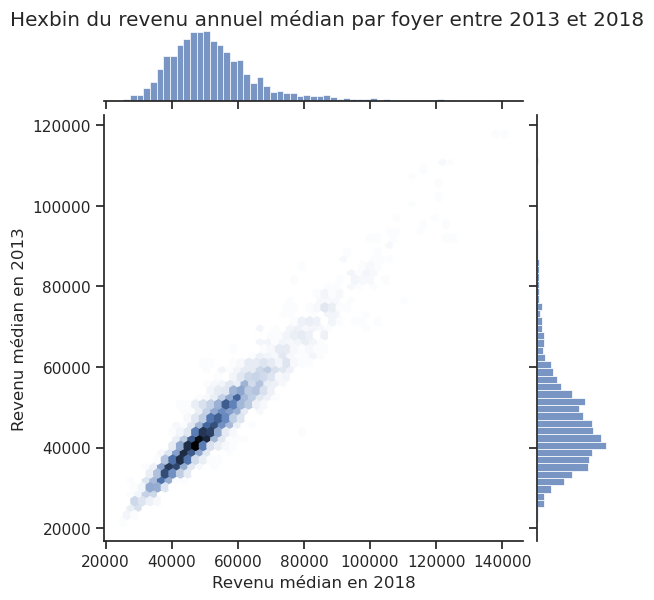

In [43]:
sns.set_theme(style="ticks")
x = total_db_geo["med_h_income_year_2018"]
y = total_db_geo["med_h_income_year_2013"]
joint_plot = sns.jointplot(x=x, y=y, kind="hex")
joint_plot.set_axis_labels("Revenu médian en 2018", "Revenu médian en 2013")
joint_plot.fig.suptitle("Hexbin du revenu annuel médian par foyer entre 2013 et 2018", y = 1)

On observe la même chose que pour le chômage : les corrélations sont mêmes plus importantes puisque toutes supérieures à 95%. Le hexbin montre également cette quasi parfaite corrélation entre les deux années extrêmes, car tous les comtés sont situés sur la diagonale. Il y a donc très peu de comtés qui sont passés d'un revenu médian important à un revenu médian faible (ou l'inverse).

### Proportion de détenteurs d'un bachelor

In [44]:
print("On observe la même chose que pour le chômage : les corrélations sont mêmes plus importantes puisque toutes supérieures à 95%. \nLe hexbin montre également cette quasi parfaite corrélation entre les deux années extrêmes, car tous les comtés sont situés sur la diagonale. Il y a donc très peu de comtés qui sont passés d'un revenu médian important à un revenu médian faible (ou l'inverse).")
print("\nProportion de détenteurs d'un bachelor :")

On observe la même chose que pour le chômage : les corrélations sont mêmes plus importantes puisque toutes supérieures à 95%. 
Le hexbin montre également cette quasi parfaite corrélation entre les deux années extrêmes, car tous les comtés sont situés sur la diagonale. Il y a donc très peu de comtés qui sont passés d'un revenu médian important à un revenu médian faible (ou l'inverse).

Proportion de détenteurs d'un bachelor :


In [45]:
matrix = total_db_geo[["bachelors_deg_year_2013", "bachelors_deg_year_2014", "bachelors_deg_year_2015", 
"bachelors_deg_year_2016", "bachelors_deg_year_2017", "bachelors_deg_year_2018"]].corr()
fig = px.imshow(matrix, title= "Matrice de corrélation des parts de détenteurs de bachelor", labels = {"color" : "Corrélation"})
fig.show()

Text(0.5, 1, "Hexbin de la part de détenteurs d'un bachelor entre 2013 et 2018")

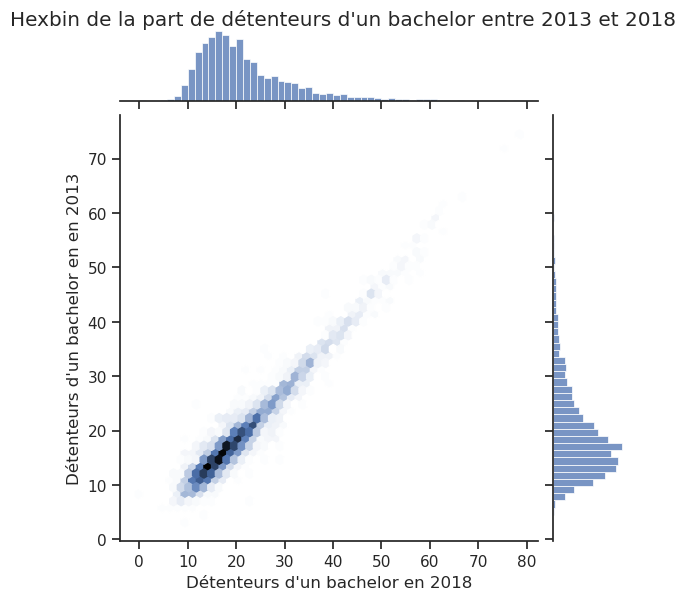

In [46]:
sns.set_theme(style="ticks")
x = total_db_geo["bachelors_deg_year_2018"]
y = total_db_geo["bachelors_deg_year_2013"]
joint_plot = sns.jointplot(x=x, y=y, kind="hex")
joint_plot.set_axis_labels("Détenteurs d'un bachelor en 2018", "Détenteurs d'un bachelor en en 2013")
joint_plot.fig.suptitle("Hexbin de la part de détenteurs d'un bachelor entre 2013 et 2018", y =1)

Encore une fois, les données suggèrent qu'utiliser une année ou l'autre n'aura pas d'influence sur les résultats de l'analyse du fait de la similarité des années.

### Bénéficaires du programme SNAP

In [47]:
print("Encore une fois, les données suggèrent qu'utiliser une année ou l'autre n'aura pas d'influence sur les résultats de l'analyse du fait de la similarité des années.")
print("\nBénéficaires du programme SNAP :")

Encore une fois, les données suggèrent qu'utiliser une année ou l'autre n'aura pas d'influence sur les résultats de l'analyse du fait de la similarité des années.

Bénéficaires du programme SNAP :


In [48]:
total_db_geo["snap_share_year_2013"] = total_db_geo["snap_beneficiaries_year_2013"] / total_db_geo["resident_pop_year_2013"] / 1000
total_db_geo["snap_share_year_2014"] = total_db_geo["snap_beneficiaries_year_2014"] / total_db_geo["resident_pop_year_2014"] / 1000
total_db_geo["snap_share_year_2015"] = total_db_geo["snap_beneficiaries_year_2015"] / total_db_geo["resident_pop_year_2015"] / 1000
total_db_geo["snap_share_year_2016"] = total_db_geo["snap_beneficiaries_year_2016"] / total_db_geo["resident_pop_year_2016"] / 1000
total_db_geo["snap_share_year_2017"] = total_db_geo["snap_beneficiaries_year_2017"] / total_db_geo["resident_pop_year_2017"] / 1000
total_db_geo["snap_share_year_2018"] = total_db_geo["snap_beneficiaries_year_2018"] / total_db_geo["resident_pop_year_2018"] / 1000


In [49]:
matrix = total_db_geo[["snap_share_year_2013", "snap_share_year_2014", "snap_share_year_2015", 
"snap_share_year_2016", "snap_share_year_2017", "snap_share_year_2018"]].corr()
fig = px.imshow(matrix, title= "Matrice de corrélation des parts de bénéficiaires du SNAP", labels = {"color" : "Corrélation"})
fig.show()

Text(0.5, 1, 'Hexbin de la part bénéficaires du SNAP entre 2013 et 2018')

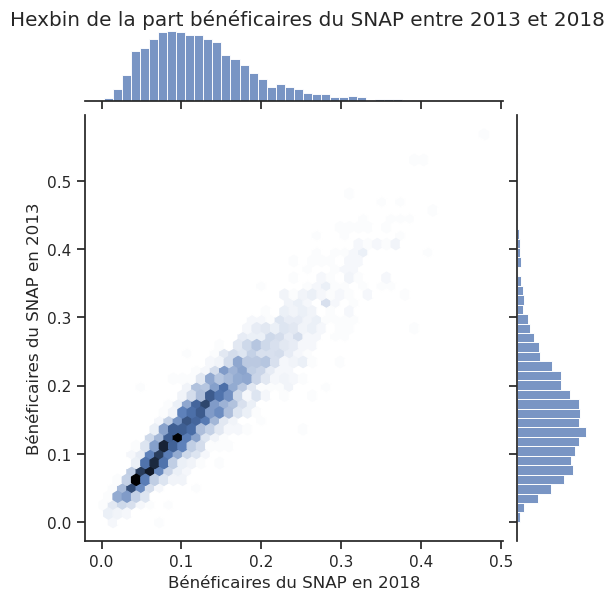

In [50]:
sns.set_theme(style="ticks")
x = total_db_geo["snap_share_year_2018"]
y = total_db_geo["snap_share_year_2013"]
joint_plot = sns.jointplot(x=x, y=y, kind="hex")
joint_plot.set_axis_labels("Bénéficaires du SNAP en 2018", "Bénéficaires du SNAP en 2013")
joint_plot.fig.suptitle("Hexbin de la part bénéficaires du SNAP entre 2013 et 2018", y =1)

Même si la diagonale est plus étalée en haut à droite (donc quand les valeurs sont relativement importantes), rien ne semble indiquer qu'il y a des différences significatives dans la structure des données entre ces deux années.

## Corrélation entre les variables

Nous allons arbitrairement prendre les variables de 2013. Nous avons vu précédemment que cela n'allait pas changer beaucoup les résultats des analyses.

In [51]:
print("Même si la diagonale est plus étalée en haut à droite (donc quand les valeurs sont relativement importantes), rien ne semble indiquer qu'il y a des différences significatives dans la structure des données entre ces deux années.")
print("\nCorrélation entre les variables :\n")
print("Nous allons arbitrairement prendre les variables de 2013. Nous avons vu précédemment que cela n'allait pas changer beaucoup les résultats des analyses.")

Même si la diagonale est plus étalée en haut à droite (donc quand les valeurs sont relativement importantes), rien ne semble indiquer qu'il y a des différences significatives dans la structure des données entre ces deux années.

Corrélation entre les variables :

Nous allons arbitrairement prendre les variables de 2013. Nous avons vu précédemment que cela n'allait pas changer beaucoup les résultats des analyses.


In [52]:
matrix = total_db_geo[["unemp_rate_year_2013", "snap_share_year_2013", "bachelors_deg_year_2013", "med_h_income_year_2013", "per_dem", "score_legis"]].corr()
fig = px.imshow(matrix, title= "Matrice de corrélation de 2013", labels = {"color" : "Corrélation"})
fig.show()

Les corrélations sont logiques et relativement aisées à expliquer, sauf pour le score legislatif. Le taux de chômage est postiviment corrélé aux bénéficiaires de l'aide alimentaire (suggère des comtés paupérisés), négativement à la part de détenteurs d'un bachelor (les plus éduqués sont a priori moins au chômage que les autres), négativement au revenu médian (plus il y a de chômage, plus ce revenu est abs a priori), et positivement au vote démocrate (plus diffile à bien expliquer).

Globalement, les variables "positives" comme le revenu médian et la part de diplômés sont positivement corrélées entre elles et négativement corrélées avec les variables "négatives" comme la part de bénéficiaires de l'aide alimentaire et le taux de chômage. Le vote démocrate a la même corrélation avec toutes les variables (0.2), sauf pour la part de détenteurs d'un bachelor, qui est plus forte (0.4) : cela s'explique bien car les plus éduqués votent plus démocrates que les autres.

La corrélation la plus forte du score législatif (hormis avec lui-même) est avec le revenu médian et avec le vote démocrate. Peut-être que certains états pauvres votent démocrates et ont donc une législation plus forte sur les armes, mais il est difficile de tirer de réelles conclusions à partir de ces corrélations là.

# Liens de ces caractéristiques avec la violence par arme à feu

Maintenant que nous avons décrit plus en détail les comtés, nous allons esssayer de voir comment cela s'articule avec les données sur les violences par arme à feu. Commençons par la densité des incidents.

In [53]:
print("Les corrélations sont logiques et relativement aisées à expliquer, sauf pour le score legislatif. \nLe taux de chômage est postiviment corrélé aux bénéficiaires de l'aide alimentaire (ce qui suggère des comtés paupérisés), négativement à la part de détenteurs d'un bachelor (les plus éduqués sont a priori moins au chômage que les autres), \nnégativement au revenu médian (plus il y a de chômage, plus ce revenu est bas a priori), et positivement au vote démocrate (plus diffile à bien expliquer).\n")
print("Globalement, les variables 'positives' comme le revenu médian et la part de diplômés sont positivement corrélées entre elles et négativement corrélées avec les variables 'négatives' comme la part de bénéficiaires de l'aide alimentaire et le taux de chômage. \nLe vote démocrate a la même corrélation avec toutes les variables (0.2), sauf pour la part de détenteurs d'un bachelor, qui est plus forte (0.4) : cela s'explique bien car les plus éduqués votent plus démocrates que les autres.\n")
print("La corrélation la plus forte du score législatif (hormis avec lui-même) est avec le revenu médian et avec le vote démocrate. \nPeut-être que certains états riches votent démocrates et ont donc une législation plus forte sur les armes, mais il est difficile de tirer de réelles conclusions à partir de ces corrélations là.\n")
print("\nIII. Liens de ces caractéristiques avec la violence par arme à feu\n")
print("Maintenant que nous avons décrit plus en détail les comtés, nous allons esssayer de voir comment cela s'articule avec les données sur les violences par arme à feu. \nCommençons par la densité des incidents :")

Les corrélations sont logiques et relativement aisées à expliquer, sauf pour le score legislatif. 
Le taux de chômage est postiviment corrélé aux bénéficiaires de l'aide alimentaire (ce qui suggère des comtés paupérisés), négativement à la part de détenteurs d'un bachelor (les plus éduqués sont a priori moins au chômage que les autres), 
négativement au revenu médian (plus il y a de chômage, plus ce revenu est bas a priori), et positivement au vote démocrate (plus diffile à bien expliquer).

Globalement, les variables 'positives' comme le revenu médian et la part de diplômés sont positivement corrélées entre elles et négativement corrélées avec les variables 'négatives' comme la part de bénéficiaires de l'aide alimentaire et le taux de chômage. 
Le vote démocrate a la même corrélation avec toutes les variables (0.2), sauf pour la part de détenteurs d'un bachelor, qui est plus forte (0.4) : cela s'explique bien car les plus éduqués votent plus démocrates que les autres.

La corrélation 

In [54]:
#count of incidents for each county
incident_count_by_county = merge_geo.groupby('id_county')['incident_id'].count().reset_index() 

#new dataframe with the count
incident_pop_geo=pd.merge(incident_count_by_county,merge_geo, on='id_county', how='right')
incident_pop_geo.rename(columns={'incident_id_x':'incident_count_by_county'}, inplace=True)

#calcul de la densité
agg_incident_county = incident_pop_geo.groupby('id_county').agg({'incident_count_by_county': 'first', 'resident_pop_year_2016': 'first'}).reset_index()
agg_incident_county['incident_density'] = agg_incident_county['incident_count_by_county'] / agg_incident_county['resident_pop_year_2016'] / 1000


# Create a GeoDataFrame with the incident density
incident_density_geo = total_db_geo.merge(agg_incident_county, on='id_county', how='left')
incident_density_geo["incident_density"] = incident_density_geo["incident_density"] * 1000

# ajouter la valeur à 0 à ceux qui n'apparaissaient pas dans la base de gun violences
incident_density_geo["incident_density"] = incident_density_geo["incident_density"].fillna(0)
incident_density_geo["incident_count_by_county"] = incident_density_geo["incident_count_by_county"].fillna(0)

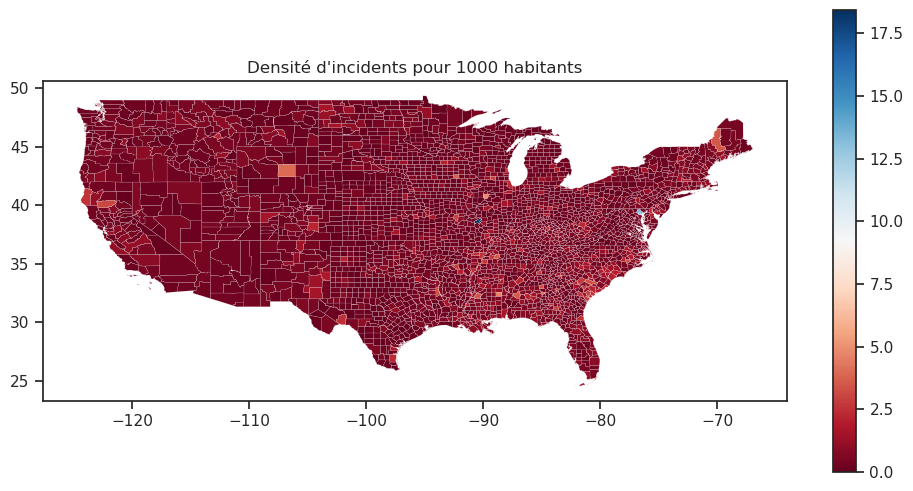

In [55]:
incident_density_geo.plot(aspect = 1, figsize = (12,6), legend = True, linewidth = 0.1, cmap = "RdBu", 
column = "incident_density")

plt.title("Densité d'incidents pour 1000 habitants")
plt.show()

Encore une fois, la carte est difficile à lire. Nous allons donc utiliser la même méthode que précédemment et regrouper les comtés dans 4 quantiles.

In [56]:
print("Encore une fois, la carte est difficile à lire. Nous allons donc utiliser la même méthode que précédemment et regrouper les comtés dans 4 quantiles.")

Encore une fois, la carte est difficile à lire. Nous allons donc utiliser la même méthode que précédemment et regrouper les comtés dans 4 quantiles.


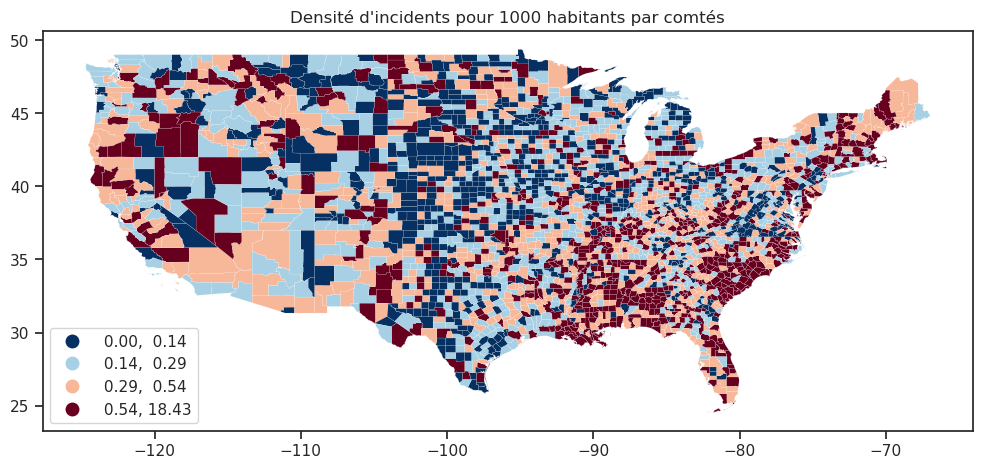

In [57]:
incident_density_geo.plot(aspect = 1, figsize = (12,6), legend = True, linewidth = 0.1, cmap = "RdBu_r", 
column = "incident_density", scheme = "QUANTILES", k=4, legend_kwds={'loc': 'lower left'})

plt.title("Densité d'incidents pour 1000 habitants par comtés")
plt.show()

Le centre du pays semble avoir une assez faible densité d'incidents, contrairements à la côte Est. La côte Ouest est quant à elle plus contrastée.

In [58]:
print("Le centre du pays semble avoir une assez faible densité d'incidents, contrairements à la côte Est. La côte Ouest est quant à elle plus contrastée.")

Le centre du pays semble avoir une assez faible densité d'incidents, contrairements à la côte Est. La côte Ouest est quant à elle plus contrastée.


In [59]:
incident_density_geo["state_resident_pop_year_2016"] = incident_density_geo.groupby("Etat")["resident_pop_year_2016_x"].transform("sum")
incident_density_geo["incident_count_by_state"] = incident_density_geo.groupby("Etat")["incident_count_by_county"].transform("sum")
incident_density_geo["incident_density_state"] = incident_density_geo["incident_count_by_state"] / incident_density_geo["state_resident_pop_year_2016"]

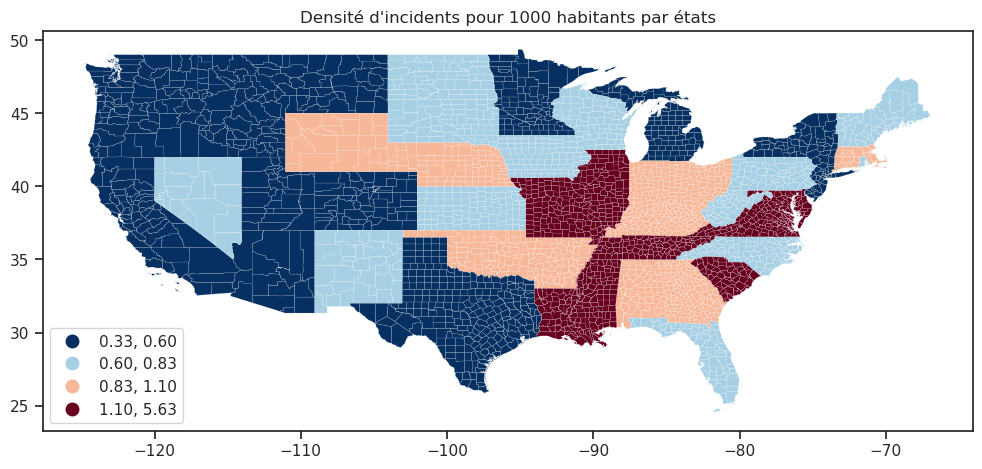

In [60]:
incident_density_geo.plot(aspect = 1, figsize = (12,6), legend = True, linewidth = 0.1, cmap = "RdBu_r", 
column = "incident_density_state", scheme = "QUANTILES", k=4, legend_kwds={'loc': 'lower left'})

plt.title("Densité d'incidents pour 1000 habitants par états")
plt.show()

Cette carte, quoique moins précise, est plus lisible que la précédente. On y voit que l'Ouest est globalement moins touché par les incidents à arme à fau que l'Est, qui concentre les états avec la plus grande densité.

In [61]:
print("Cette carte, quoique moins précise, est plus lisible que la précédente. \nOn y voit que l'Ouest est globalement moins touché par les incidents à arme à feu que l'Est, qui concentre les états avec la plus grande densité d'incidents.")

Cette carte, quoique moins précise, est plus lisible que la précédente. 
On y voit que l'Ouest est globalement moins touché par les incidents à arme à feu que l'Est, qui concentre les états avec la plus grande densité d'incidents.


Text(0.5, 0, "Nombre d'incidents")

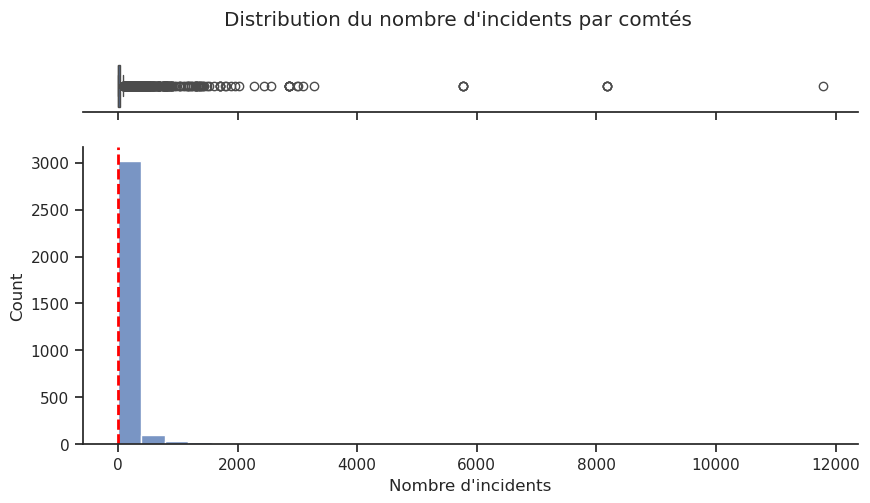

In [62]:
sns.set(style="ticks")
x = incident_density_geo["incident_count_by_county"] 

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=(10,5))

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=30, ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

median_value = x.median()
ax_hist.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label='Median')

plt.suptitle("Distribution du nombre d'incidents par comtés")
ax_hist.set_xlabel("Nombre d'incidents")

On voit que la majorité des comtés ont moins de 500 incidents. Le graphique est cependant peu lisible à cause des importants outliers qui l'étirent. Après vérification manuelle, le comté avec le plus d'incident est le comté de Cook, dans l'Illinois. Cela se comprend assez bien car la ville de Chicago, réputée pour sa criminalité élevée, en est le chef-lieu.

In [63]:
print("On remarque que la majorité des comtés enregistre moins de 500 incidents. Le graphique est cependant peu lisible à cause des importants outliers qui l'étirent. \nAprès vérification manuelle, le comté ayant le plus d'incident est le comté de Cook, dans l'Illinois. Cela se comprend assez bien car la ville de Chicago, réputée pour sa criminalité élevée, en est le chef-lieu.")

On remarque que la majorité des comtés enregistre moins de 500 incidents. Le graphique est cependant peu lisible à cause des importants outliers qui l'étirent. 
Après vérification manuelle, le comté ayant le plus d'incident est le comté de Cook, dans l'Illinois. Cela se comprend assez bien car la ville de Chicago, réputée pour sa criminalité élevée, en est le chef-lieu.


Text(0.5, 0, "Nombre d'incidents")

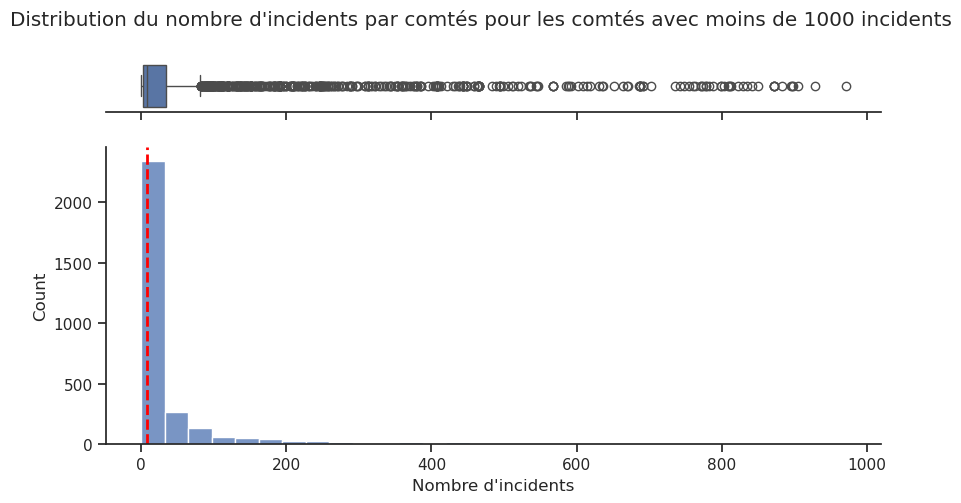

In [64]:
sns.set(style="ticks")
x = incident_density_geo[incident_density_geo["incident_count_by_county"] < 1000]["incident_count_by_county"]

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=(10,5))

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=30, ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

median_value = x.median()
ax_hist.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label='Median')

plt.suptitle("Distribution du nombre d'incidents par comtés pour les comtés avec moins de 1000 incidents")
ax_hist.set_xlabel("Nombre d'incidents")

Même en ne prenant que les comtés avec moins de 1000 incidents la distribution garde la même forme : la majorité des comtés sont tout à gauche de la distribution (donc avec peu d'incidents) et de nombreux outliers atteignent des valeurs très importantes. Ils se voient sur le box plot mais pas sur l'histogramme.

In [65]:
print("Même en ne prenant que les comtés avec moins de 1000 incidents la distribution garde la même forme : la majorité des comtés est tout à gauche de la distribution (donc avec peu d'incidents) et de nombreux outliers atteignent des valeurs très importantes. \nOn les remarque sur le box plot mais pas sur l'histogramme.")

Même en ne prenant que les comtés avec moins de 1000 incidents la distribution garde la même forme : la majorité des comtés est tout à gauche de la distribution (donc avec peu d'incidents) et de nombreux outliers atteignent des valeurs très importantes. 
On les remarque sur le box plot mais pas sur l'histogramme.


In [66]:
# comptage du nombre de suicides par comtés
# on fait la somme des indicatrices suicides après avoir groupé par comtés
incident_density_geo = incident_density_geo.merge(merge_geo.groupby('id_county')["indic_suicide"].sum(), on = "id_county", how = "left")
incident_density_geo = incident_density_geo.rename(columns = {"indic_suicide" : "suicide_by_county"})
incident_density_geo["suicide_by_county"] = incident_density_geo["suicide_by_county"].fillna(0)
incident_density_geo["suicide_density"] = incident_density_geo["suicide_by_county"] / incident_density_geo["resident_pop_year_2016_x"]

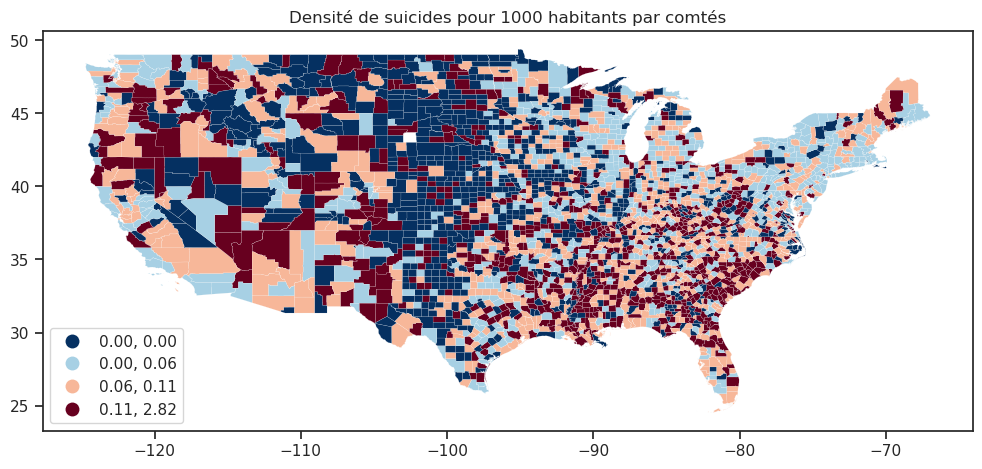

In [67]:
incident_density_geo.plot(aspect = 1, figsize = (12,6), legend = True, linewidth = 0.1, cmap = "RdBu_r", 
column = "suicide_density", scheme = "QUANTILES", k=4, legend_kwds={'loc': 'lower left'})

plt.title("Densité de suicides pour 1000 habitants par comtés")
plt.show()

A l'Ouest, les grands comtés (donc les plus ruraux) semblent être les plus touchés. Le centre du pays semble relativement moins touché. A l'Est, il est difficile de décrire quelque chose de précis, si ce n'est que la Géorgie et les deux Caroline paraissent être plus touchées que la moyenne.

In [68]:
print("A l'Ouest, les grands comtés (donc les plus ruraux) semblent être les plus touchés. Le centre du pays semble relativement moins touché. \nA l'Est, il est difficile de décrire quelque chose de précis, si ce n'est que la Géorgie et les deux Caroline paraissent être plus touchées que la moyenne.")

A l'Ouest, les grands comtés (donc les plus ruraux) semblent être les plus touchés. Le centre du pays semble relativement moins touché. 
A l'Est, il est difficile de décrire quelque chose de précis, si ce n'est que la Géorgie et les deux Caroline paraissent être plus touchées que la moyenne.


Text(0.5, 0, "Nombre d'incidents")

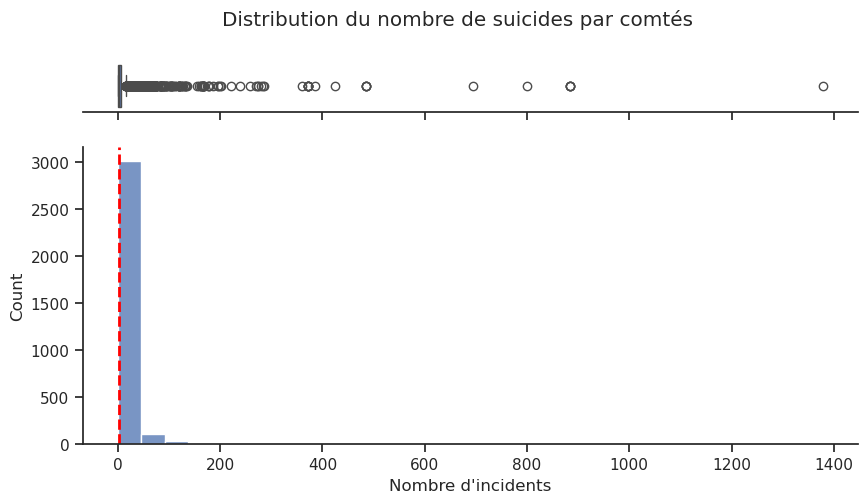

In [69]:
sns.set(style="ticks")
x = incident_density_geo["suicide_by_county"]

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)}, figsize=(10,5))

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=30, ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

median_value = x.median()
ax_hist.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label='Median')

plt.suptitle("Distribution du nombre de suicides par comtés")
ax_hist.set_xlabel("Nombre d'incidents")

On observe la même forme de distribution que pour les incidents. La seule différence est que tout semble diviser par 10, ce qui est logique puisque les suicides représentent environ 13% des incidents.

Intéressons nous désormais au nombre de tués et de blessés.

In [70]:
print("On observe la même forme de distribution que pour les incidents. La seule différence est que tout semble diviser par 10, ce qui est logique puisque les suicides représentent environ 13% des incidents.")
print("\nIntéressons nous désormais au nombre de tués et de blessés.")

On observe la même forme de distribution que pour les incidents. La seule différence est que tout semble diviser par 10, ce qui est logique puisque les suicides représentent environ 13% des incidents.

Intéressons nous désormais au nombre de tués et de blessés.


In [71]:
# calcul du nombre de tués par county
incident_density_geo = incident_density_geo.merge(merge_geo.groupby('id_county')["n_killed"].sum(), on = "id_county", how = "left")
incident_density_geo = incident_density_geo.rename(columns = {"n_killed" : "n_killed_by_county"})
incident_density_geo["n_killed_by_county"] = incident_density_geo["n_killed_by_county"].fillna(0)
incident_density_geo["n_killed_density"] = incident_density_geo["n_killed_by_county"] / incident_density_geo["resident_pop_year_2016_x"]

# calcul du nombre de blessés par county
incident_density_geo = incident_density_geo.merge(merge_geo.groupby('id_county')["n_injured"].sum(), on = "id_county", how = "left")
incident_density_geo = incident_density_geo.rename(columns = {"n_injured" : "n_injured_by_county"})
incident_density_geo["n_injured_by_county"] = incident_density_geo["n_injured_by_county"].fillna(0)
incident_density_geo["n_injured_density"] = incident_density_geo["n_injured_by_county"] / incident_density_geo["resident_pop_year_2016_x"]


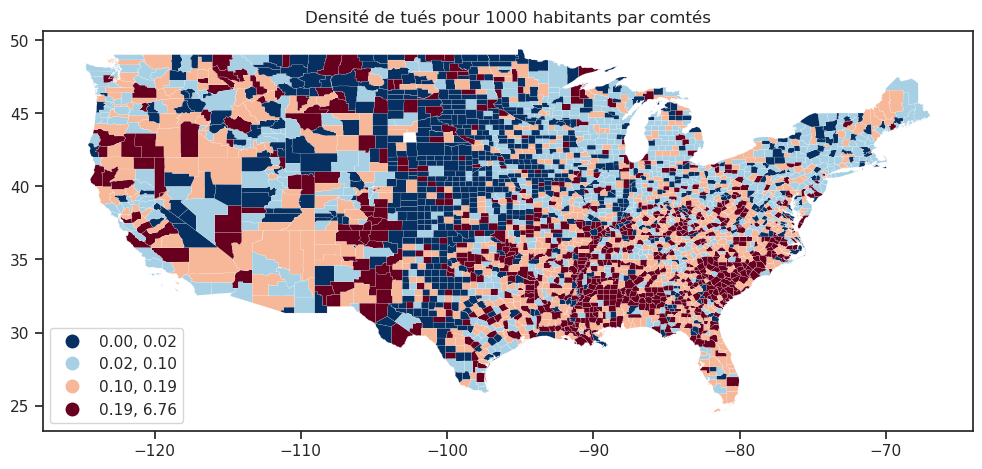

In [72]:
incident_density_geo.plot(aspect = 1, figsize = (12,6), legend = True, linewidth = 0.1, cmap = "RdBu_r", 
column = "n_killed_density", scheme = "QUANTILES", k=4, legend_kwds={'loc': 'lower left'})

plt.title("Densité de tués pour 1000 habitants par comtés")
plt.show()

La distribution reste relativement proche de celles des incidents. Le centre paraît moins touchés par les victimes que les incidents, mais c'est la seule différence vraiment visible.

In [73]:
print("La distribution reste relativement proche de celles des incidents. Le centre paraît moins touchés par les victimes que les incidents, mais c'est la seule différence vraiment visible.")

La distribution reste relativement proche de celles des incidents. Le centre paraît moins touchés par les victimes que les incidents, mais c'est la seule différence vraiment visible.


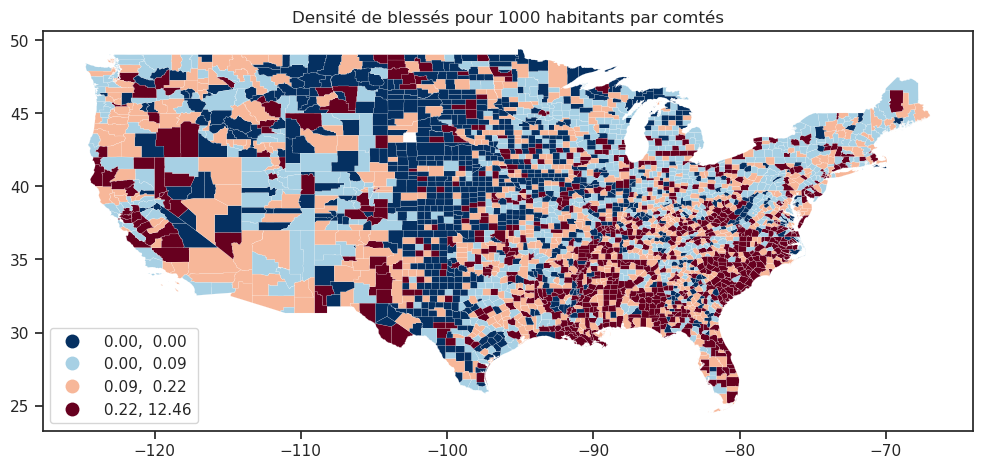

In [74]:
incident_density_geo.plot(aspect = 1, figsize = (12,6), legend = True, linewidth = 0.1, cmap = "RdBu_r", 
column = "n_injured_density", scheme = "QUANTILES", k=4, legend_kwds={'loc': 'lower left'})

plt.title("Densité de blessés pour 1000 habitants par comtés")
plt.show()

La distribution est très similaire à celles des tués.

Corrélation avec les variables sociaux démographiques.

In [75]:
print("La distribution est très similaire à celles des tués.\n")
print("Corrélation avec les variables sociaux démographiques :")

La distribution est très similaire à celles des tués.

Corrélation avec les variables sociaux démographiques :


In [91]:
#ajout de la densité de population au dataframe des incidents
incident_density_geo = incident_density_geo.merge(total_db_geo[["pop_density_2013", "id_county"]], on = "id_county")

In [94]:
matrix = incident_density_geo[["unemp_rate_year_2013", "snap_share_year_2013", "bachelors_deg_year_2013", 
"med_h_income_year_2013", "per_dem", "score_legis", "pop_density_2013", "incident_density", "suicide_density", "n_killed_density", "n_injured_density"]].corr()
fig = px.imshow(matrix, title= "Matrice de corrélation de 2013", labels = {"color" : "Corrélation"})
fig.show()

La densité d'incidents ne semble être corrélées de façon significative qu'avec les autres variables dépendants des incidents. On peut cependant remarquer la corrélation positive avec le vote démocrate et avec la part de bénéficaires de l'aide alimentaire.

On observe le même phénomène pour les trois autres variables des incidents (densité de suicide, de morts et de blessés). Cela semble donc indiquer que les variables sociaux démographiques étudiées précédemment ne permettent pas vraiment d'expliquer l'apparition des incidents et de leurs victimes.

In [77]:
print("La densité d'incidents ne semble être corrélée de façon significative qu'avec les autres variables dépendants des incidents. \nOn peut cependant remarquer la corrélation positive avec le vote démocrate et avec la part de bénéficaires de l'aide alimentaire.")
print("On observe le même phénomène pour les trois autres variables des incidents (densité de suicide, de morts et de blessés). \nCela semble donc indiquer que les variables sociaux démographiques étudiées précédemment ne permettent pas vraiment d'expliquer l'apparition des incidents et de leurs victimes.")

La densité d'incidents ne semble être corrélée de façon significative qu'avec les autres variables dépendants des incidents. 
On peut cependant remarquer la corrélation positive avec le vote démocrate et avec la part de bénéficaires de l'aide alimentaire.
On observe le même phénomène pour les trois autres variables des incidents (densité de suicide, de morts et de blessés). 
Cela semble donc indiquer que les variables sociaux démographiques étudiées précédemment ne permettent pas vraiment d'expliquer l'apparition des incidents et de leurs victimes.


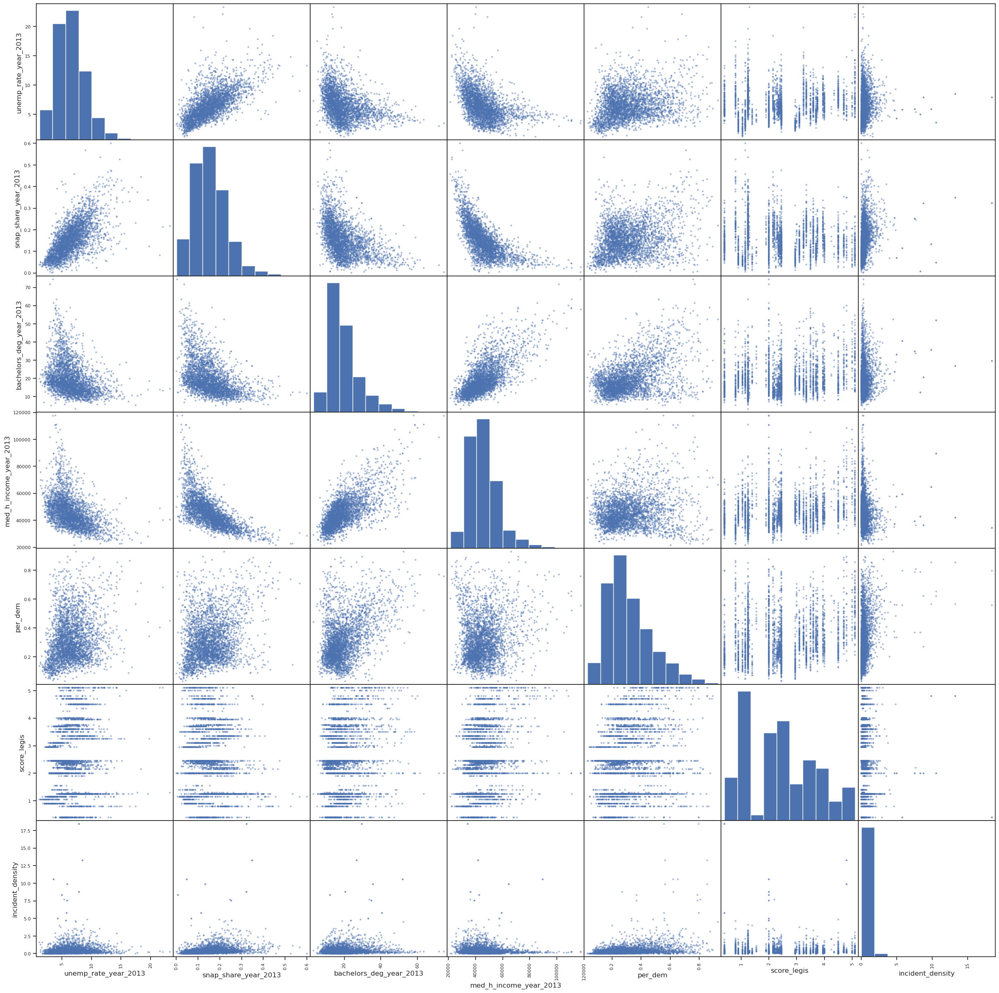

In [78]:
matrix = incident_density_geo[["unemp_rate_year_2013", "snap_share_year_2013", "bachelors_deg_year_2013", 
"med_h_income_year_2013", "per_dem", "score_legis", "incident_density"]]
scatter = pd.plotting.scatter_matrix(matrix, figsize = (30,30))

On voit sur la dernière ligne que la densité des incidents semblent pouvoir n'être simplement prédite à partir d'aucune des variables sélectionnées précédemment.

On observe la même chose pour la densité de tués, blessés et suicides.

In [79]:
print("On voit sur la dernière ligne que la densité des incidents semble pouvoir n'être prédite simplement à partir d'aucune des variables sélectionnées précédemment.")
print("On observe la même chose pour la densité de tués, blessés et suicides.")

On voit sur la dernière ligne que la densité des incidents semble pouvoir n'être prédite simplement à partir d'aucune des variables sélectionnées précédemment.
On observe la même chose pour la densité de tués, blessés et suicides.
